[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1C_tSNoJThgwgBzyHZPSf6oIG2VB9yWlx?authuser=1#scrollTo=ix9XA_JnCqSX)

# ♻️ Revolutionizing Plastic Detection in the Wild with AI-Powered Object Detection

## 1. Problem


Plastic pollution is a significant threat to the environment, and it is challenging to detect and locate plastic waste in outdoor environments. Manual detection is a time-consuming and resource-intensive process, and the traditional methods are not always effective. This problem has led to an increase in plastic waste in the environment, which can cause harm to wildlife, ecosystems, and even humans.



## 2. Data


The data we're using is a part of this dataset from Kaggle: *Plastic Bottles in the wild Image Dataset*

https://www.kaggle.com/datasets/siddharthkumarsah/plastic-bottles-image-dataset



## 3. Features

Some information about the data:

* The plastic bottle dataset consists of approximately 8,000 images of plastic bottles. we use just 50 images to train and 20 images to valid.

* The bottle's are captured in various outdoor settings, each of which has been annotated using the [xmin, ymin, xmax, ymax] bounding box format. 

* The dataset is designed for training and testing object detection models that can identify plastic bottles in real-world scenarios.




In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/Plastic Bottle Image Dataset.zip" -d "/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/"

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import Numpy ✅
* Import Matplotlib ✅
* Make sure we're using a GPU 

In [ ]:
# Import necessary tools
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

print("TF version: ", tf.__version__)

TF version:  2.12.0


## Preparing our data 

### Turning our data into TFRecords

The labels we have are in JSON format, we have to proccess the files to turn this all in a single TFRecord file format.

## Turn JSON file to CSV 

In [ ]:
# import tools
import json
import pickle
import zipfile

#!pip install tf_slim

In [ ]:
import pandas as pd

In [ ]:
type_file = "valid"
path = "/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/valid/labels/labels_valid.json"
data_file = open(path)
data = json.load(data_file)

In [ ]:
data

[{'id': '07d029ac-146a-401d-9b24-e2958cc4b9f706b309c2-af7e-4f78-b989-bb7a1e5ddc3b',
  'image': '-143_jpg.rf.d1c9ecf3790d291e6e8abdbe436d2272.jpg',
  'width': 340,
  'height': 227,
  'timestamp': 0,
  'segmentation_url': '',
  'classification': [],
  'skiped': False,
  'tags': [{'parent': None,
    'color': '#101fea',
    'pos': {'x': 99, 'y': 34, 'w': 75, 'h': 171},
    'classes': [],
    'name': 'bottle',
    'id': '0c70698f-9897-4ea0-b699-b76c6bf0a8bf',
    'text': None,
    'type': 'bounding_box'},
   {'parent': None,
    'color': '#101fea',
    'pos': {'x': 177, 'y': 24, 'w': 79, 'h': 148},
    'classes': [],
    'name': 'bottle',
    'id': 'de22339f-e09b-436e-bbd5-1fe9854d7b26',
    'text': None,
    'type': 'bounding_box'}]},
 {'id': '07d029ac-146a-401d-9b24-e2958cc4b9f7cb081736-a1a7-4c28-8ec0-56a8d0ff2c24',
  'image': '_104195843_hi050201387_jpg.rf.a9520460f03fcaea46d2d7b0bd9edd48.jpg',
  'width': 976,
  'height': 549,
  'timestamp': 0,
  'segmentation_url': '',
  'classificatio

In [ ]:
csv_list = []
for classification in data:
  width, height = classification['width'], classification['height']
  image = classification['image']
  for item in classification['tags']:
    name = item['name'] 
    xmin = item['pos']['x']
    ymin = item['pos']['y']
    xmax = item['pos']['x'] + item['pos']['w'] 
    ymax = item['pos']['y'] + item['pos']['h'] 

    value = (image, width, height, name, xmin, ymin, xmax, ymax)
    csv_list.append(value)

columns_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax'] 
csv_df = pd.DataFrame(csv_list, columns = columns_name)

csv_df.to_csv("/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/valid/labels/{}_labels.csv".format(type_file))

In [ ]:
csv_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,-143_jpg.rf.d1c9ecf3790d291e6e8abdbe436d2272.jpg,340,227,bottle,99.000000,34.000000,174.000000,205.000000
1,-143_jpg.rf.d1c9ecf3790d291e6e8abdbe436d2272.jpg,340,227,bottle,177.000000,24.000000,256.000000,172.000000
2,_104195843_hi050201387_jpg.rf.a9520460f03fcaea...,976,549,bottle,287.000000,80.000000,450.000000,426.000000
3,_104195843_hi050201387_jpg.rf.a9520460f03fcaea...,976,549,bottle,574.000000,153.000000,908.000000,431.000000
4,_104195843_hi050201387_jpg.rf.a9520460f03fcaea...,976,549,bottle,595.000000,96.000000,949.000000,240.000000
5,_104195843_hi050201387_jpg.rf.a9520460f03fcaea...,976,549,bottle,25.000000,161.000000,299.000000,497.000000
6,-21_jpg.rf.1f7ef01afb2421419880544fd707e2c9.jpg,340,367,bottle,38.000000,59.000000,137.000000,335.000000
7,-21_jpg.rf.1f7ef01afb2421419880544fd707e2c9.jpg,340,367,bottle,153.000000,33.000000,249.000000,275.000000
8,-21_jpg.rf.1f7ef01afb2421419880544fd707e2c9.jpg,340,367,bottle,251.000000,20.000000,334.000000,252.000000
9,bottle-67-_JPG.rf.02336b23a32254f0d7eb17c2061f...,6000,4000,bottle,1250.000000,700.000000,2629.166667,3004.166667


## Turn CSV to TFRecord

In [ ]:
## intall object detection library

import os
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git
%cd /content/models/
!git checkout 58d19c67e1d30d905dd5c6e5092348658fed80af
!apt-get update && apt-get install -y -qq protobuf-compiler python-pil python-lxml python-tk
!pip install -q Cython contextlib2 pillow lxml matplotlib
!pip install -q pycocotools
%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/'
!python object_detection/builders/model_builder_test.py


/content
/content/models
Note: switching to '58d19c67e1d30d905dd5c6e5092348658fed80af'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at 58d19c67e Internal change
Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [1,009 kB]
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal 

Turn CSV to TFRecord

doc: https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/tensorflow-1.14/training.html


In [ ]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow as tf
import sys
sys.path.append("../../models/research")

from PIL import Image
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict


# TO-DO replace this with label map
# for multiple labels add more else if statements
def class_text_to_int(row_label):
    if row_label == 'bottle':  # 'ship':
        return 1
    else:
        None


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    # check if the image format is matching with your images.
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

output_path = 'valid.record'
img_path = '/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/valid/images'
csv_input = '/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/valid/labels/valid_labels.csv'

writer = tf.io.TFRecordWriter(output_path)
path = os.path.join(img_path)
examples = pd.read_csv(csv_input)
grouped = split(examples, 'filename')
for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())

writer.close()
output_path = os.path.join(os.getcwd(), output_path)
print('Successfully created the TFRecords: {}'.format(output_path))



Successfully created the TFRecords: /content/models/research/valid.record


## Training Our Model


In [ ]:
## import tools
import os
import pandas as pd
import json
import pickle
import zipfile
import shutil

# Instalamos los paquetes necesarios para que funcione desde la Colab
!pip install avro-python3
!pip install 
!pip install tf_slim==1.1.0
!pip install tf-models-official==2.7.0
!pip install lvis
!pip install tensorflow_io==0.23.1
!pip install keras==2.12.0
#!pip install opencv-python-headless==4.5.2.52

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for avro-python3: filename=avro_python3-1.10.2-py3-none-any.whl size=44008 sha256=2366bd54c1917af99ae2628fbe8e50b1dc7220a3ffb34b3b3ed4292e05845548
  Stored in directory: /root/.cache/pip/wheels/bc/85/62/6cdd81c56f923946b401cecff38055b94c9b766927f7d8ca82
Successfully built avro-python3
ERROR: You must give at least one requirement to install (see "pip help install")
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 15.9 MB/s eta 0:00:

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 58.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 68.9 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.32.0
    Uninstalling tensorflow-io-gcs-filesystem-0.32.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.32.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install opencv-python-headless

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
labels = [{'name': 'bottle', 'id': 1}]
for label in labels:
  with open('label_map.pbtxt', 'w') as f:
    f.write('item { \n')
    f.write('\tname:\'{}\'\n'.format(label['name']))
    f.write('\tid:{}\n'.format(label['id']))
    f.write('}\n')

In [ ]:
!wget --no-check-certificate http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz \
-O /content/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

--2023-05-02 18:38:37--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.136.128, 2607:f8b0:4001:c1d::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.136.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘/content/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

/content/ssd_mobile 100%[===================>]  19.56M  --.-KB/s    in 0.09s   

2023-05-02 18:38:37 (224 MB/s) - ‘/content/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]



In [ ]:
!tar -zxvf /content/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
output_path = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8'
output_path = os.path.join(os.getcwd(), output_path)
print("La carpeta se almaceno en {}".format(output_path))

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.index
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/pipeline.config
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/saved_model.pb
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/variables/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/variables/variables.index
La carpeta se almaceno en /content/models/research/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8


In [ ]:
path_training = '/content/ssd_mobilenet'
os.mkdir(path_training)

In [ ]:
import shutil

source_config = f"{output_path}/pipeline.config"
target_config = f"{path_training}/pipeline.config"
shutil.copyfile(source_config, target_config)

'/content/ssd_mobilenet/pipeline.config'

In [ ]:
import tensorflow as tf
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

In [ ]:
config = config_util.get_configs_from_pipeline_file(target_config)

In [ ]:
config

{'model': ssd {
   num_classes: 90
   image_resizer {
     fixed_shape_resizer {
       height: 320
       width: 320
     }
   }
   feature_extractor {
     type: "ssd_mobilenet_v2_fpn_keras"
     depth_multiplier: 1.0
     min_depth: 16
     conv_hyperparams {
       regularizer {
         l2_regularizer {
           weight: 3.9999998989515007e-05
         }
       }
       initializer {
         random_normal_initializer {
           mean: 0.0
           stddev: 0.009999999776482582
         }
       }
       activation: RELU_6
       batch_norm {
         decay: 0.996999979019165
         scale: true
         epsilon: 0.0010000000474974513
       }
     }
     use_depthwise: true
     override_base_feature_extractor_hyperparams: true
     fpn {
       min_level: 3
       max_level: 7
       additional_layer_depth: 128
     }
   }
   box_coder {
     faster_rcnn_box_coder {
       y_scale: 10.0
       x_scale: 10.0
       height_scale: 5.0
       width_scale: 5.0
     }
   }
   matc

In [ ]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(target_config, "r") as f:
  proto_str = f.read()
  text_format.Merge(proto_str, pipeline_config)


In [ ]:
pipeline_config

model {
  ssd {
    num_classes: 90
    image_resizer {
      fixed_shape_resizer {
        height: 320
        width: 320
      }
    }
    feature_extractor {
      type: "ssd_mobilenet_v2_fpn_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 3.9999998989515007e-05
          }
        }
        initializer {
          random_normal_initializer {
            mean: 0.0
            stddev: 0.009999999776482582
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.996999979019165
          scale: true
          epsilon: 0.0010000000474974513
        }
      }
      use_depthwise: true
      override_base_feature_extractor_hyperparams: true
      fpn {
        min_level: 3
        max_level: 7
        additional_layer_depth: 128
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0


In [ ]:
label_map_pbtxt_fname = "/content/label_map.pbtxt"
train_record_fname = "/content/train.record"
valid_record_fname = "/content/valid.record"

In [ ]:
pipeline_config.model.ssd.num_classes = 1
pipeline_config.train_config.batch_size = 4
pipeline_config.train_config.fine_tune_checkpoint = f"{output_path}/checkpoint/ckpt-0"
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path = label_map_pbtxt_fname
pipeline_config.train_input_reader.tf_record_input_reader.input_path[0] = train_record_fname
pipeline_config.eval_input_reader[0].label_map_path = label_map_pbtxt_fname
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[0] = valid_record_fname

In [ ]:
config_text = text_format.MessageToString(pipeline_config)
with tf.io.gfile.GFile(target_config, "wb") as f:
  f.write(config_text)
  

In [ ]:
num_steps = 5000
model_dir = "/content/ssd_mobilenet"
target_config = f"{path_training}/pipeline.config"

!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={target_config} \
    --model_dir={model_dir} \
    --num_train_steps={num_steps}


2023-05-02 19:16:03.285602: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-05-02 19:16:06.537185: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0502 19:16:06.556262 139864914065216 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 5000
I0502 19:16:06.559834 139864914065216 config_util.py:552] Maybe overwriting train_steps: 5000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0502 19:16:06.559991 139864914065216 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0502 19:16:06.593151 139864914065216 dep

In [ ]:
%load_ext tensorboard
%tensorboard --logdir "/content/ssd_mobilenet"

<IPython.core.display.Javascript object>

In [ ]:
output_directory = "/content/fine_tuned_model"
!python /content/models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path {target_config} \
--trained_checkpoint_dir {model_dir} \
--output_directory {output_directory}

2023-05-02 19:49:44.440399: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-05-02 19:49:47.943596: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0502 19:50:11.620826 139958671038272 save_impl.py:66] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x7f4a1c06a620>, because it is not built.
W0502 19:50:12.184729 139958671038272 save_impl.py:66] Skipping full serialization of Keras layer <keras.layers.convolutional.separable_conv2d.SeparableConv2D object at 0x7f49b1df98a0>, because it is not built.
W0502 19:50:12.184990 139958671038272 save_impl.py:66] Skipping full serialization of Keras layer <object_detection.core.freezable_batch_norm.FreezableBatchNorm object at 0x7f49b221b6a0>, because it is not built.
W0502 19:50:12.185156 1

In [ ]:
!zip -r /content/fine_tuned_model.zip /content/fine_tuned_model

  adding: content/fine_tuned_model/ (stored 0%)
  adding: content/fine_tuned_model/saved_model/ (stored 0%)
  adding: content/fine_tuned_model/saved_model/fingerprint.pb (stored 0%)
  adding: content/fine_tuned_model/saved_model/assets/ (stored 0%)
  adding: content/fine_tuned_model/saved_model/saved_model.pb (deflated 92%)
  adding: content/fine_tuned_model/saved_model/variables/ (stored 0%)
  adding: content/fine_tuned_model/saved_model/variables/variables.index (deflated 78%)
  adding: content/fine_tuned_model/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: content/fine_tuned_model/pipeline.config (deflated 68%)
  adding: content/fine_tuned_model/checkpoint/ (stored 0%)
  adding: content/fine_tuned_model/checkpoint/ckpt-0.data-00000-of-00001 (deflated 8%)
  adding: content/fine_tuned_model/checkpoint/checkpoint (deflated 42%)
  adding: content/fine_tuned_model/checkpoint/ckpt-0.index (deflated 80%)


## Inferences with our Amazing Model

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_MODEL_DIR = "/content/drive/MyDrive/fine_tuned_model"
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

In [ ]:
label_map_pbtxt_fname = "/content/label_map.pbtxt"
category_index = label_map_util.create_categories_from_labelmap(label_map_pbtxt_fname)

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# import the image
image_path = "/content/drive/MyDrive/plastic_bottle_detection_in_the_wild/test/images/garbage-empty-plastic-bottle-on-the-ground-CX0P6W_jpg.rf.e632d6c57cdbf3b80d4301c6eb8a84df.jpg"

# turn it to numpy array format
image_np = np.array(Image.open(image_path))

# turn it in a tensor and add a extra dim to be readable for our model
input_tensor = tf.convert_to_tensor(image_np)
input_tensor = input_tensor[tf.newaxis, ...]

# Realizamos la detección del objeto
detections = detect_fn(input_tensor)

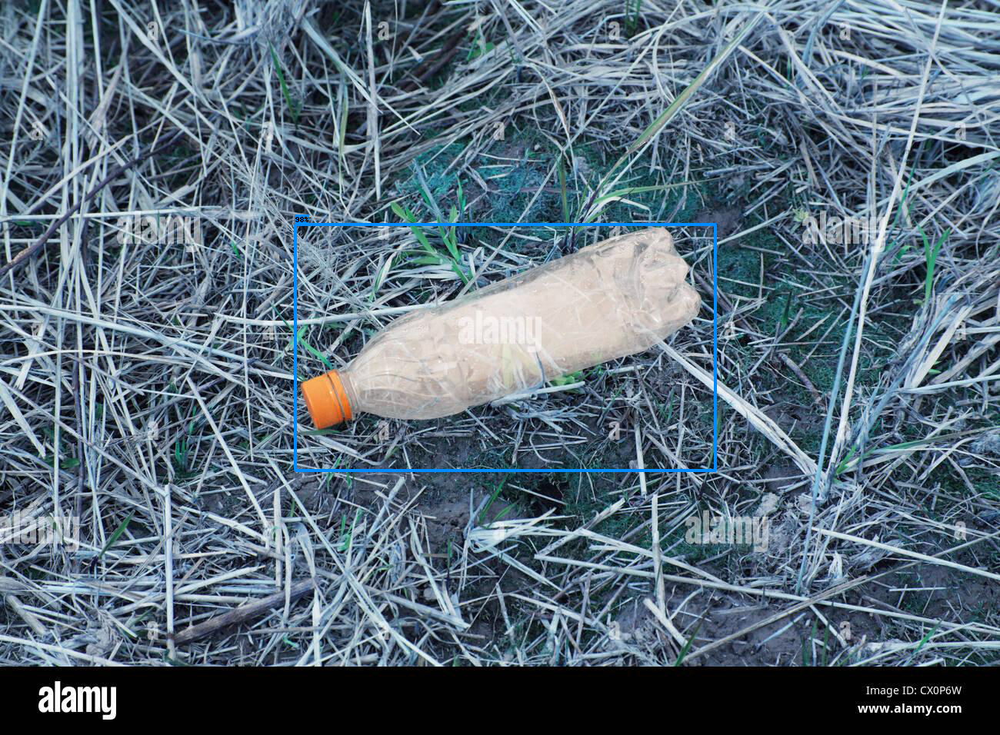

In [ ]:
# analize how much detection were
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0,:num_detections].numpy() for key, value in detections.items()}

detections['num_detections'] = num_detections

detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

# take the image and copy to draw bbox
image_np_with_detections = image_np.copy()

# Used object detection to vizualice the image and the bbox with its classification in our case we hace just one class "bottle"
viz_utils.visualize_boxes_and_labels_on_image_array(
    image=image_np_with_detections,
    boxes=detections['detection_boxes'],
    classes=detections['detection_classes'],
    scores=detections['detection_scores'],
    category_index=category_index,
    max_boxes_to_draw=200,
    min_score_thresh=0.30,
    use_normalized_coordinates = True,
    agnostic_mode = True
)


# Vizualice the result
cv2_imshow(image_np_with_detections)